## Расспознование изображений рака на МРТ снимках головного мозга

Иследуются различные алгорится расспознования изображений
Предворительно загрузили датасет с сайта kaggle
https://www.kaggle.com/datasets/navoneel/brain-mri-images-for-brain-tumor-detection

In [29]:
import pandas as pd
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import cv2
import imutils
import torch 
import torchvision
import PIL
from sklearn.model_selection import train_test_split
from ipywidgets import interact



sns.set(rc={'figure.figsize':(8, 8)})

In [2]:
A = cv2.imread('Data/yes/Y1.jpg')

<AxesSubplot:>

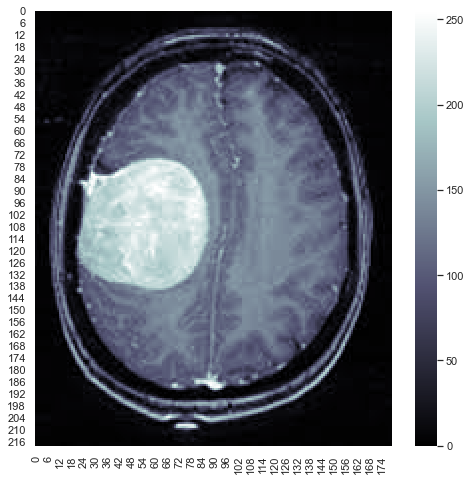

In [3]:
sns.heatmap(A[:,:,0], cmap='bone')

In [246]:
df = []
labels = []

In [247]:
for path in os.listdir("Data/yes"):

    temp = cv2.imread('Data/yes/'+path)
    if len(temp.shape) == 3:
        temp = temp[:,:,0]
    df.append(temp)
    labels.append(1)

for path in os.listdir("Data/no"):

    temp = cv2.imread('Data/no/'+path)
    
    if len(temp.shape) == 3:
        temp = temp[:,:,0]
    df.append(temp)
    labels.append(0)

In [248]:
def show_image(df, n, k):
    plt.figure(figsize=(18, 6))
    for i in range(n*k):
        plt.subplot(k, n, i+1)
        plt.axis("off")
        plt.imshow(df[i], cmap="bone")
    plt.show()

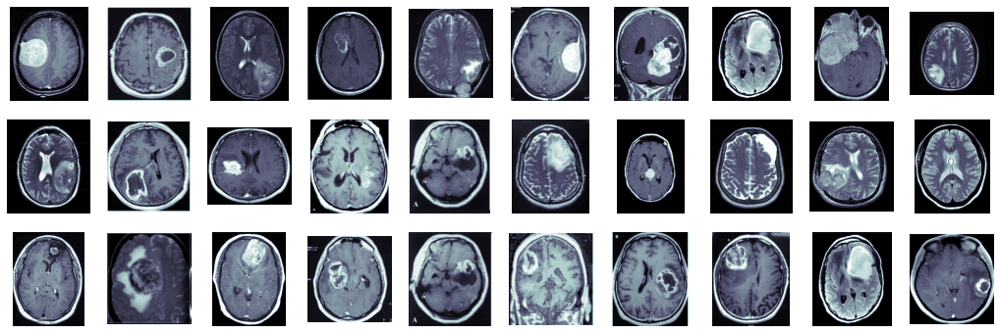

In [249]:
show_image(df, 10, 3)

![Изображение шагов алгоритма поиска краёв контура изображения](alg_steps.png)
https://pyimagesearch.com/2016/04/11/finding-extreme-points-in-contours-with-opencv/

In [250]:
def crop_imgs(set_name, add_pixels_value=0):
    """
    Finds the extreme points on the image and crops the rectangular out of them
    """
    set_new = []
    for img in set_name:
        #gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        #gray = cv2.GaussianBlur(gray, (5, 5), 0)
        gray = cv2.GaussianBlur(img, (5, 5), 0)
        
        # threshold the image, then perform a series of erosions +
        # dilations to remove any small regions of noise
        thresh = cv2.threshold(gray, 45, 255, cv2.THRESH_BINARY)[1]
        thresh = cv2.erode(thresh, None, iterations=2)
        thresh = cv2.dilate(thresh, None, iterations=2)

        # find contours in thresholded image, then grab the largest one
        cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cnts = imutils.grab_contours(cnts)
        c = max(cnts, key=cv2.contourArea)

        # find the extreme points
        extLeft = tuple(c[c[:, :, 0].argmin()][0])
        extRight = tuple(c[c[:, :, 0].argmax()][0])
        extTop = tuple(c[c[:, :, 1].argmin()][0])
        extBot = tuple(c[c[:, :, 1].argmax()][0])

        ADD_PIXELS = add_pixels_value
        new_img = img[extTop[1]-ADD_PIXELS:extBot[1]+ADD_PIXELS, extLeft[0]-ADD_PIXELS:extRight[0]+ADD_PIXELS].copy()
        set_new.append(new_img)

    return np.array(set_new, dtype=object)

In [251]:
df = crop_imgs(df)

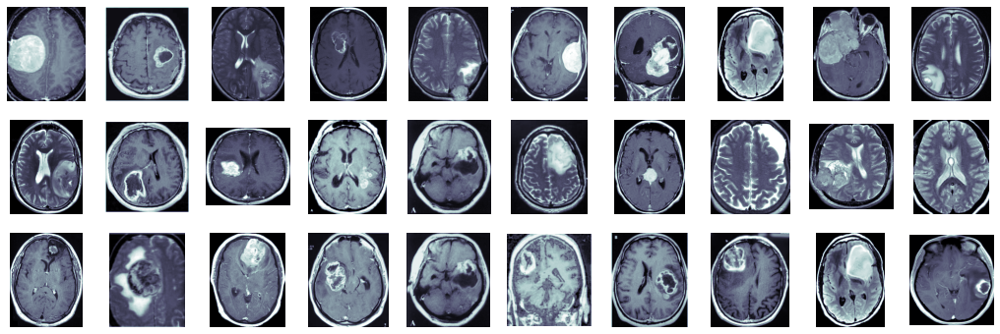

In [252]:
show_image(df, 10, 3)

https://pytorch.org/vision/stable/auto_examples/plot_transforms.html#sphx-glr-auto-examples-plot-transforms-py

In [291]:
transforms = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Resize((233,233),interpolation=torchvision.transforms.InterpolationMode.BICUBIC),
    torchvision.transforms.CenterCrop((224, 224)),
    torchvision.transforms.RandomHorizontalFlip(0.5),
    torchvision.transforms.RandomAffine(7, (0.03,0.03), (0.93, 1), (-3,3,-3,3), 
                                        interpolation=torchvision.transforms.InterpolationMode.BILINEAR),
    # Афинное преобразование: 
    # Повернуть в случайную сторону не более чем на 7 градусов
    # сместить по вертикали и горизонтали не более чем на 3 %
    # Уменьшить на не более чем в 0.93 раз
    # Сдвинуть изображение не более чем на 3 по каждой из осей
    #torchvision.transforms.Normalize(0,1)
])

In [272]:
transforms(df[0]).numpy()[0,:,:].mean()

0.41685387

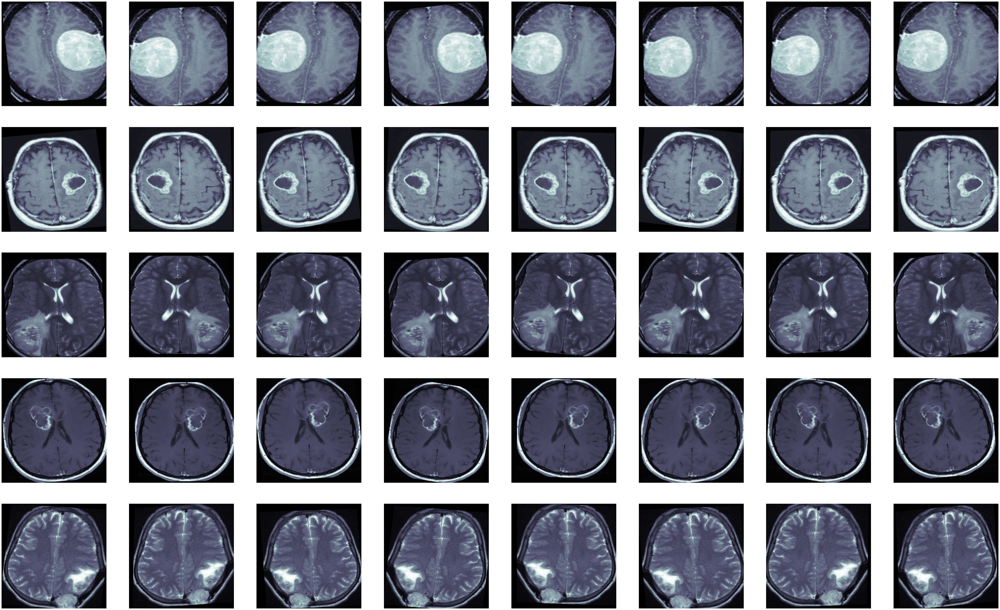

In [266]:
#plt.imshow(transforms(df[0]).numpy()[0,:,:], cmap='bone')
n = 8
k = 5

plt.figure(figsize=(n*10, k*10))
for i in range(n * k):
    plt.subplot(k, n, i+1)
    plt.axis("off")
    plt.imshow(transforms(df[i//n]).numpy()[0,:,:], cmap="bone")
    
plt.show()

Так как изображени всё равно очень похожи бруг на друга, необходимо не допустить того, что бы разные варианты одного изображения оказали одновременно и в тренировочной и тестовой выборке. Поэто для начала разделим датасет на тренировочную и тестовую выборку.

In [274]:
train_dsx, test_X, train_dsy, test_y = train_test_split(df, labels, stratify=labels, test_size=0.20)

In [297]:
k = 6
train_X = []
train_y = []

for i in range(len(train_dsx)):
    for j in range(k):
        train_X.append(transforms(train_dsx[i]).numpy()[0,:,:])
        train_y.append(train_dsy[i])
train_X = np.array(train_X)
train_y = np.array(train_y)

numpy.ndarray